Aqui gerei dois pkl, um bem pesado com 160k curvas (10k amostras por curva) e uma leve com 4500 curvas (100 amostras por curva) o arquivo leve pesou 7,1mb e o grande pesou 25gb

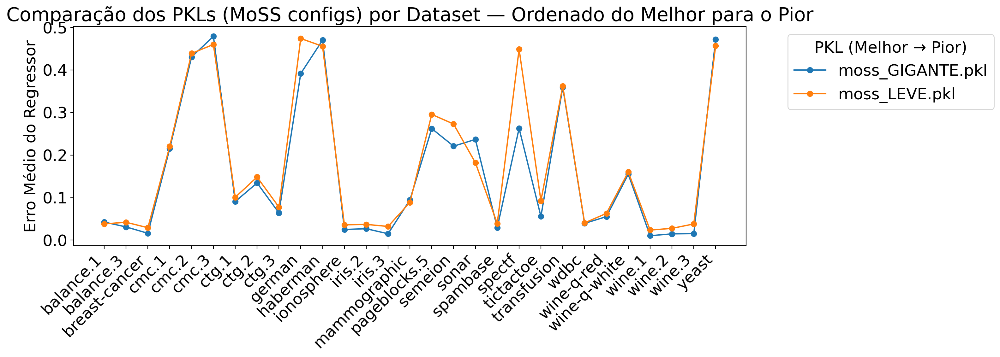

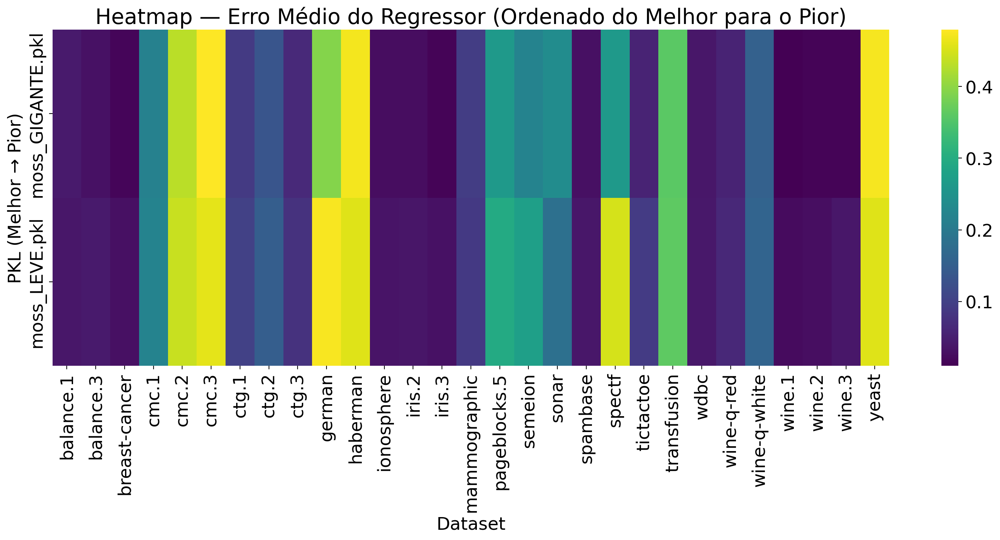

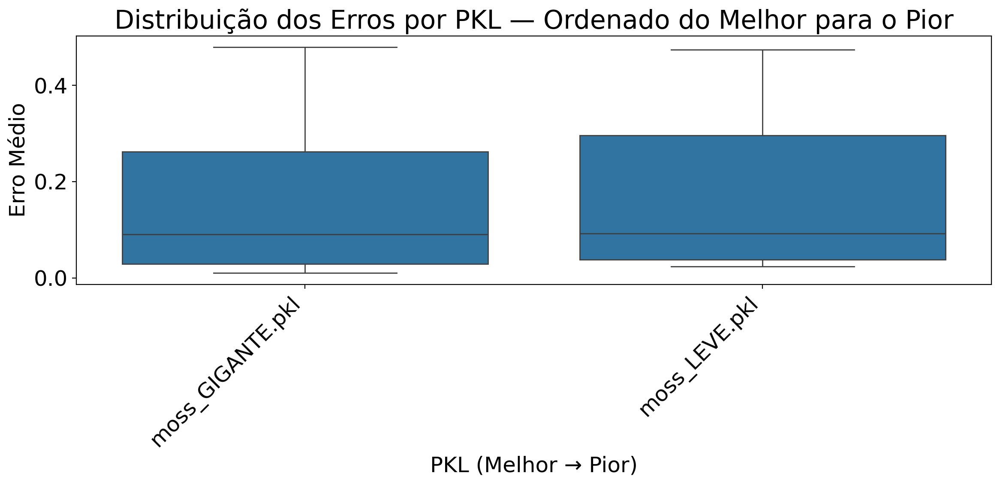

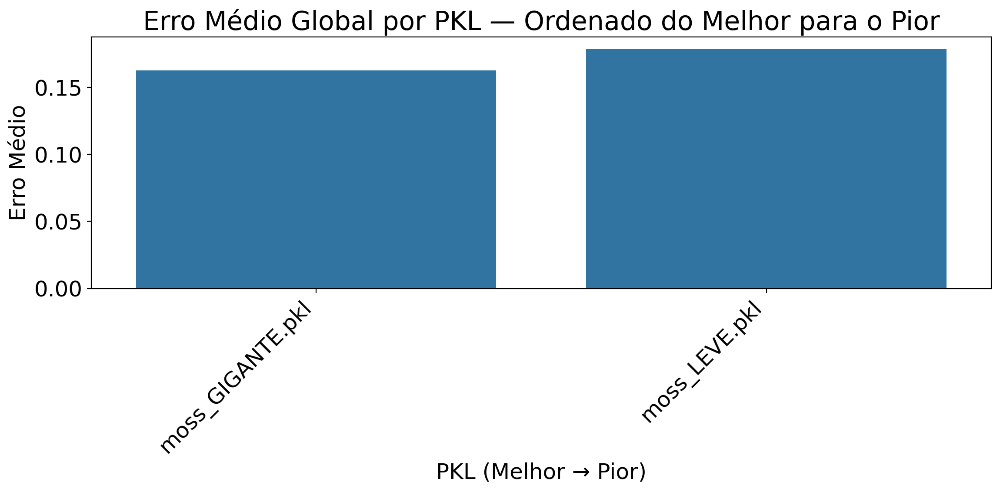

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------------------------
# Carregar resultados
# -----------------------------------------------------------
df = pd.read_csv("resultados_regressor_por_pkl.csv")

# Ordenar datasets pelo nome
df["dataset"] = df["dataset"].astype(str)
datasets_ordenados = sorted(df["dataset"].unique())
df["dataset"] = pd.Categorical(df["dataset"], categories=datasets_ordenados, ordered=True)

# -----------------------------------------------------------
# Ordenar PKLs do melhor (menor erro) para o pior (maior erro)
# -----------------------------------------------------------
df_media = df.groupby("pkl_name")["erro_medio_regressor"].mean().reset_index()
df_media = df_media.sort_values("erro_medio_regressor")  # ordenação aqui
pkls_ordenados = df_media["pkl_name"].tolist()

# Garanti que df respeite essa ordem
df["pkl_name"] = pd.Categorical(df["pkl_name"], categories=pkls_ordenados, ordered=True)

# -----------------------------------------------------------
# Gráfico de Linhas (1 linha por PKL) — ordenado do melhor → pior
# -----------------------------------------------------------
plt.figure(figsize=(16, 6))
for pkl in pkls_ordenados:
    df_p = df[df["pkl_name"] == pkl].sort_values("dataset")
    plt.plot(df_p["dataset"], df_p["erro_medio_regressor"], marker="o", label=pkl)

plt.xticks(rotation=45, ha="right")
plt.ylabel("Erro Médio do Regressor")
plt.title("Comparação dos PKLs (MoSS configs) por Dataset — Ordenado do Melhor para o Pior")
plt.legend(title="PKL (Melhor → Pior)", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# -----------------------------------------------------------
# Heatmap PKL × Dataset (erro) — ordenado do melhor → pior
# -----------------------------------------------------------
pivot = df.pivot(index="pkl_name", columns="dataset", values="erro_medio_regressor")
pivot = pivot.loc[pkls_ordenados]  # aplica ordenação

plt.figure(figsize=(16, 8))
sns.heatmap(pivot, cmap="viridis", annot=False)
plt.title("Heatmap — Erro Médio do Regressor (Ordenado do Melhor para o Pior)")
plt.xlabel("Dataset")
plt.ylabel("PKL (Melhor → Pior)")
plt.tight_layout()
plt.show()

# -----------------------------------------------------------
# Boxplot: Distribuição de Erros por PKL — ordenado do melhor → pior
# -----------------------------------------------------------
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x="pkl_name", y="erro_medio_regressor", order=pkls_ordenados)
plt.xticks(rotation=45, ha="right")
plt.title("Distribuição dos Erros por PKL — Ordenado do Melhor para o Pior")
plt.ylabel("Erro Médio")
plt.xlabel("PKL (Melhor → Pior)")
plt.tight_layout()
plt.show()

# -----------------------------------------------------------
# Gráfico de Barras: Erro Médio Global por PKL — ordenado
# -----------------------------------------------------------
plt.figure(figsize=(12, 6))
sns.barplot(data=df_media, x="pkl_name", y="erro_medio_regressor", order=pkls_ordenados)
plt.xticks(rotation=45, ha="right")
plt.title("Erro Médio Global por PKL — Ordenado do Melhor para o Pior")
plt.ylabel("Erro Médio")
plt.xlabel("PKL (Melhor → Pior)")
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis, entropy
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from mlquantify.methods.aggregative import DySsyn
import quapy as qp
import pickle
import warnings
import time
from typing import Protocol

warnings.filterwarnings("ignore")

# ===========================
# ===== Funções base ========
# ===========================

def extract_features(scores):
    features = {
        'mean': np.mean(scores),
        'var': np.var(scores),
        'skew': skew(scores),
        'kurt': kurtosis(scores),
        'q10': np.quantile(scores, 0.1),
        'q25': np.quantile(scores, 0.25),
        'q50': np.quantile(scores, 0.5),
        'q75': np.quantile(scores, 0.75),
        'q90': np.quantile(scores, 0.9)
    }
    hist, _ = np.histogram(scores, bins=20, density=True)
    hist = hist + 1e-12
    features['entropy'] = entropy(hist)
    return features


def generate_artificial_prevalences(n_dim, n_prev=19, n_iter=1):
    if n_dim != 2:
        raise NotImplementedError("Apenas binário por enquanto.")
    prevalences = np.linspace(0.05, 0.95, n_prev)
    combos = [[1-p, p] for p in prevalences]
    return combos * n_iter


def get_indexes_with_prevalence(y, prevalence, batch_size):
    pos_idx = np.where(y == 1)[0]
    neg_idx = np.where(y == 0)[0]
    n_pos = int(batch_size * prevalence[1])
    n_neg = batch_size - n_pos
    pos_sel = np.random.choice(pos_idx, size=n_pos, replace=True)
    neg_sel = np.random.choice(neg_idx, size=n_neg, replace=True)
    idx = np.concatenate([pos_sel, neg_sel])
    np.random.shuffle(idx)
    return idx


class APP(Protocol):
    def __init__(self, batch_size, n_prevalences, repeats=1, random_state=None):
        self.batch_size = batch_size if isinstance(batch_size, list) else [batch_size]
        self.n_prevalences = n_prevalences
        self.repeats = repeats
        self.random_state = random_state
        if random_state is not None:
            np.random.seed(random_state)

    def split(self, X, y):
        n_dim = len(np.unique(y))
        for batch_size in self.batch_size:
            prevalences = generate_artificial_prevalences(n_dim, self.n_prevalences, self.repeats)
            for prev in prevalences:
                idx = get_indexes_with_prevalence(y, prev, batch_size)
                yield idx, prev


# ===========================
# ===== Treino Regressor ====
# ===========================

with open("moss_ns100_np30_nm3_nc10.pkl", "rb") as f:
    synthetic_distributions = pickle.load(f)

X_features, y_labels = [], []
for key, curves in synthetic_distributions.items():
    all_scores = np.concatenate(curves) if isinstance(curves, list) else curves
    feats = extract_features(all_scores)
    X_features.append(list(feats.values()))
    y_labels.append(key[0] if isinstance(key, tuple) else key)

X_features = np.array(X_features)
y_labels = np.array(y_labels)

reg = RandomForestRegressor(n_estimators=300, random_state=42)
reg.fit(X_features, y_labels)


# ===========================
# ===== Avaliação APP =======
# ===========================

def avaliar_dataset_APP(nome, X, y, app_protocol):
    if len(np.unique(y)) > 2:
        y = (y == np.max(y)).astype(int)

    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.5, random_state=42, stratify=y
    )

    clf = RandomForestClassifier(n_estimators=300, random_state=42)
    clf.fit(X_train, y_train)

    dyssin_model = DySsyn(RandomForestClassifier(n_estimators=300, random_state=42))
    dyssin_model.fit(X_train, y_train)

    resultados = []
    tempos_regressor = []
    tempos_dyssyn = []

    for idx, prev in app_protocol.split(X_test, y_test):
        X_batch, y_batch = X_test[idx], y_test[idx]
        real_prev = np.mean(y_batch)
        scores = clf.predict_proba(X_batch)[:, 1]

        # === Tempo Regressor ===
        feats = np.array(list(extract_features(scores).values())).reshape(1, -1)
        t0 = time.perf_counter()
        pred_prev_reg = reg.predict(feats)[0]
        t_reg = time.perf_counter() - t0

        # === Tempo DySsyn ===
        t0 = time.perf_counter()
        pred_prev_dyssin = dyssin_model.predict(X_batch)[1]
        t_dys = time.perf_counter() - t0

        tempos_regressor.append(t_reg)
        tempos_dyssyn.append(t_dys)

        resultados.append({
            "Dataset": nome,
            "Prev_Real": real_prev,
            "Prev_Alvo": prev[1],
            "Regressor": pred_prev_reg,
            "DySsyn": pred_prev_dyssin,
            "Erro_Regressor": abs(real_prev - pred_prev_reg),
            "Erro_DySsyn": abs(real_prev - pred_prev_dyssin),
            "Tempo_Regressor": t_reg,
            "Tempo_DySsyn": t_dys
        })

    df = pd.DataFrame(resultados)
    df["Tempo_Médio_Regressor"] = np.mean(tempos_regressor)
    df["Tempo_Médio_DySsyn"] = np.mean(tempos_dyssyn)
    return df


# ===========================
# ===== Rodar Experimentos ===
# ===========================

datasets_names = [
    "balance.1", "balance.3", "breast-cancer",
    "cmc.1", "cmc.2", "cmc.3", "ctg.1", "ctg.2", "ctg.3", "german",
    "haberman", "ionosphere", "iris.2", "iris.3", "mammographic",
    "pageblocks.5", "semeion", "sonar", "spambase", "spectf",
    "tictactoe", "transfusion", "wdbc", "wine.1", "wine.2",
    "wine.3", "wine-q-red", "wine-q-white", "yeast"
]

# ===========================
# LOOP DE BATCH SIZES 🔥
# ===========================

for batch in range(10, 201, 10):
    print(f"\n\n==============================")
    print(f"🚀 Testando batch_size = {batch}")
    print(f"==============================\n")

    app = APP(batch_size=batch, n_prevalences=19, repeats=2, random_state=42)

    resultados_detalhados = []
    resumo_final = []

    for nome in datasets_names:
        try:
            print(f"\n🔍 Carregando dataset QuaPy: {nome}")
            dataset = qp.datasets.fetch_UCIBinaryDataset(nome)

            X_train, y_train = dataset.training.X, dataset.training.y
            X_test, y_test = dataset.test.X, dataset.test.y

            X = np.vstack([X_train, X_test])
            y = np.concatenate([y_train, y_test])
            X = np.array(X)
            y = np.array(y).ravel()

            print(f"✅ Rodando APP no dataset {nome}")
            df_app = avaliar_dataset_APP(nome, X, y, app)

            resultados_detalhados.append(df_app)

            mean_errors = df_app[["Erro_Regressor", "Erro_DySsyn"]].mean()
            mean_times = df_app[["Tempo_Regressor", "Tempo_DySsyn"]].mean()

            resumo_final.append({
                "Dataset": nome,
                "Erro Médio Regressor": mean_errors["Erro_Regressor"],
                "Erro Médio DySsyn": mean_errors["Erro_DySsyn"],
                "Tempo Médio Regressor (s)": mean_times["Tempo_Regressor"],
                "Tempo Médio DySsyn (s)": mean_times["Tempo_DySsyn"],
                "Batch_Size": batch
            })

        except Exception as e:
            print(f"❌ Erro no dataset {nome}: {e}")

    # ---- Salvar por batch ----
    df_detalhado = pd.concat(resultados_detalhados, ignore_index=True)
    df_resumo = pd.DataFrame(resumo_final)

    df_detalhado.to_csv(f"resultados_APP_detalhado_batch{batch}.csv", index=False)
    df_resumo.to_csv(f"resultados_APP_resumo_batch{batch}.csv", index=False)

    print("\n===== RESULTADOS SALVOS =====")
    print(f"📄 resultados_APP_detalhado_batch{batch}.csv")
    print(f"📄 resultados_APP_resumo_batch{batch}.csv")



🚀 Testando batch_size = 10


🔍 Carregando dataset QuaPy: balance.1
✅ Rodando APP no dataset balance.1

🔍 Carregando dataset QuaPy: balance.3
✅ Rodando APP no dataset balance.3

🔍 Carregando dataset QuaPy: breast-cancer
✅ Rodando APP no dataset breast-cancer

🔍 Carregando dataset QuaPy: cmc.1
✅ Rodando APP no dataset cmc.1

🔍 Carregando dataset QuaPy: cmc.2
✅ Rodando APP no dataset cmc.2

🔍 Carregando dataset QuaPy: cmc.3
✅ Rodando APP no dataset cmc.3

🔍 Carregando dataset QuaPy: ctg.1
✅ Rodando APP no dataset ctg.1

🔍 Carregando dataset QuaPy: ctg.2
✅ Rodando APP no dataset ctg.2

🔍 Carregando dataset QuaPy: ctg.3
✅ Rodando APP no dataset ctg.3

🔍 Carregando dataset QuaPy: german
✅ Rodando APP no dataset german

🔍 Carregando dataset QuaPy: haberman
✅ Rodando APP no dataset haberman

🔍 Carregando dataset QuaPy: ionosphere
✅ Rodando APP no dataset ionosphere

🔍 Carregando dataset QuaPy: iris.2
✅ Rodando APP no dataset iris.2

🔍 Carregando dataset QuaPy: iris.3
✅ Rodando APP no dataset

Arquivos encontrados:
 - resultados_APP_detalhado_batch10.csv
 - resultados_APP_detalhado_batch100.csv
 - resultados_APP_detalhado_batch110.csv
 - resultados_APP_detalhado_batch120.csv
 - resultados_APP_detalhado_batch130.csv
 - resultados_APP_detalhado_batch140.csv
 - resultados_APP_detalhado_batch150.csv
 - resultados_APP_detalhado_batch160.csv
 - resultados_APP_detalhado_batch170.csv
 - resultados_APP_detalhado_batch180.csv
 - resultados_APP_detalhado_batch190.csv
 - resultados_APP_detalhado_batch20.csv
 - resultados_APP_detalhado_batch200.csv
 - resultados_APP_detalhado_batch30.csv
 - resultados_APP_detalhado_batch40.csv
 - resultados_APP_detalhado_batch50.csv
 - resultados_APP_detalhado_batch60.csv
 - resultados_APP_detalhado_batch70.csv
 - resultados_APP_detalhado_batch80.csv
 - resultados_APP_detalhado_batch90.csv


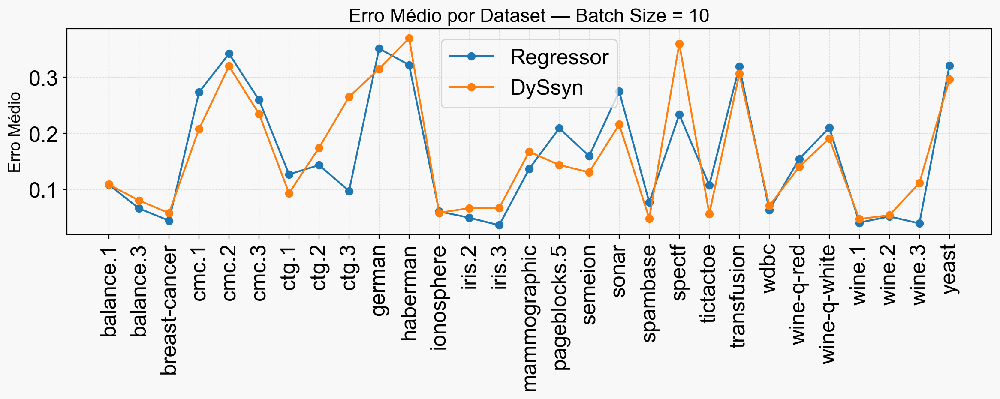

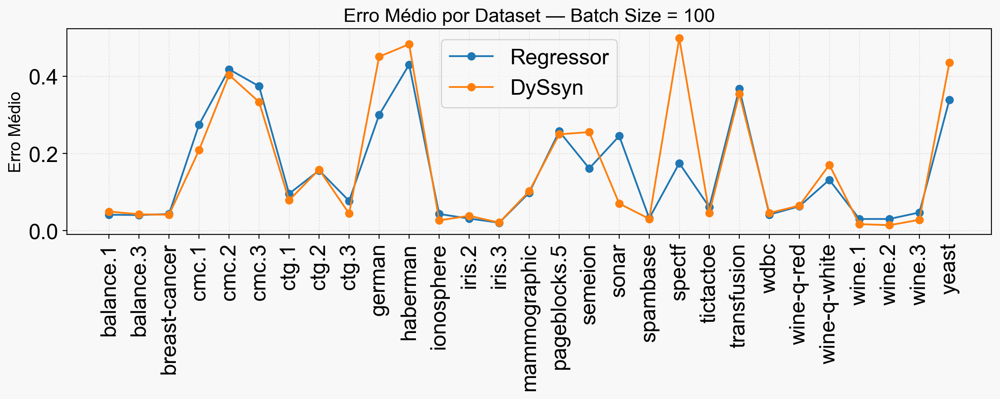

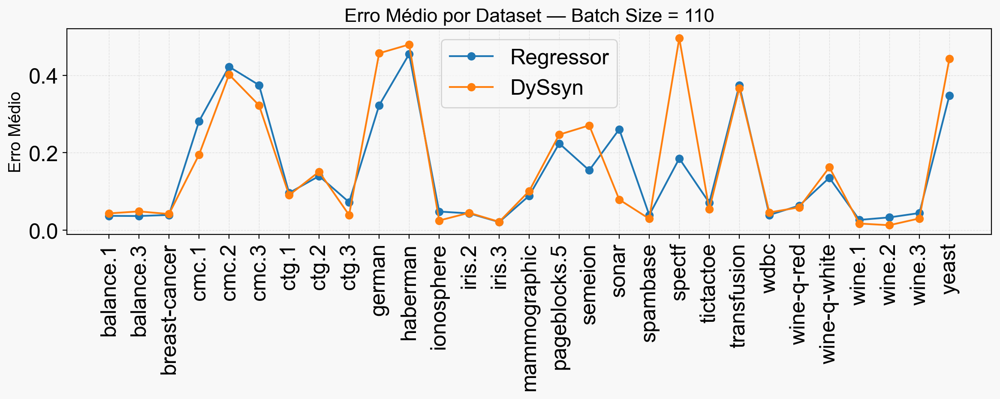

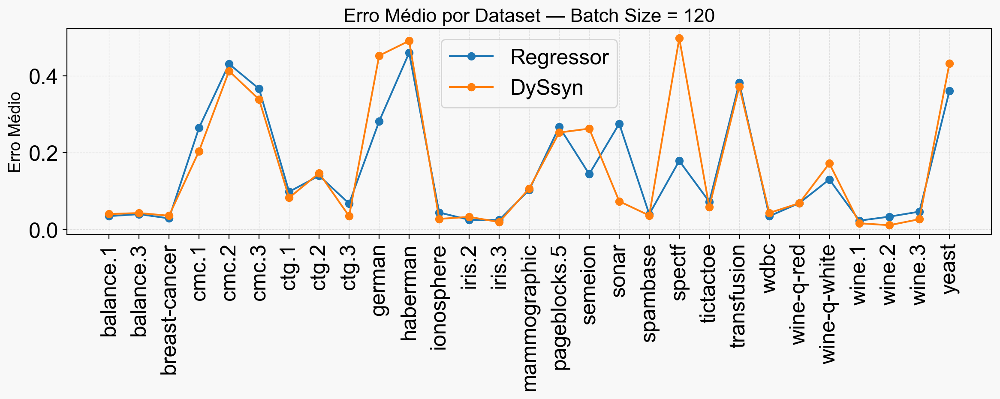

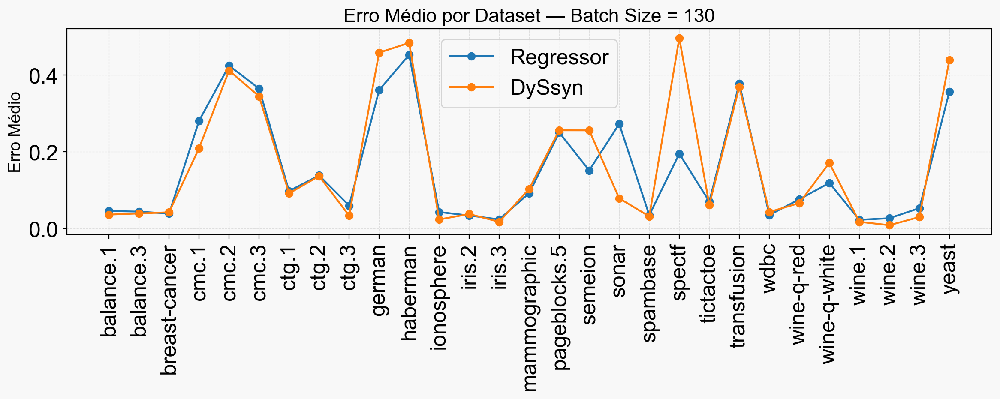

...

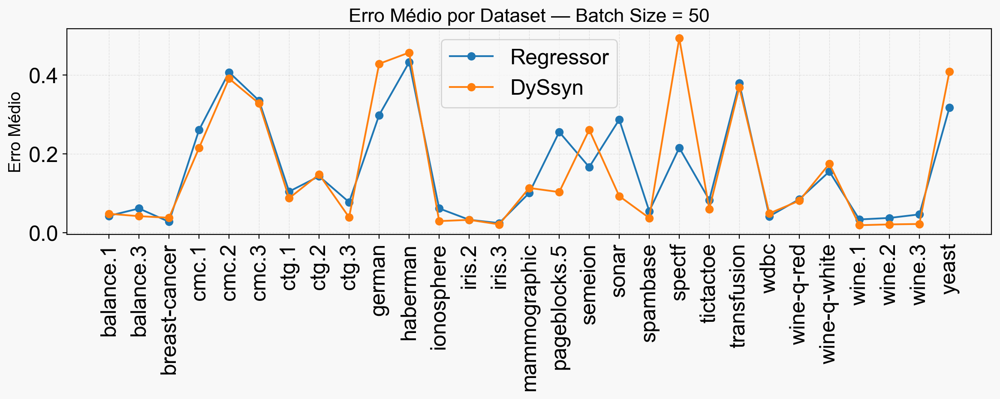

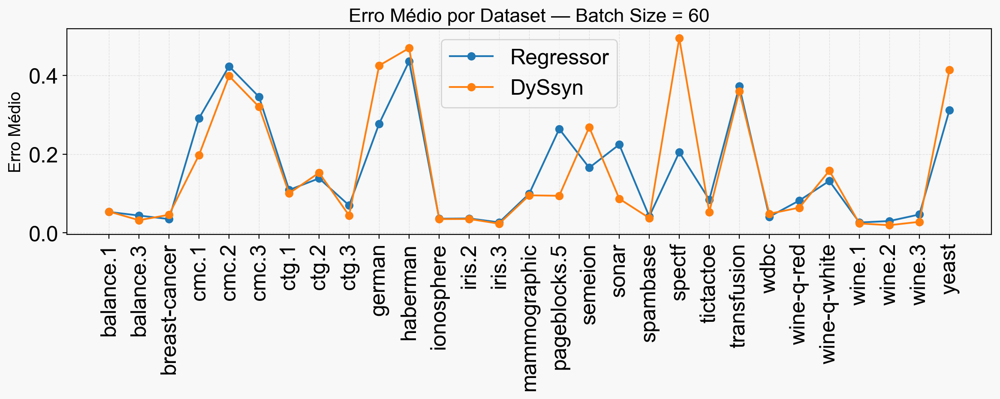

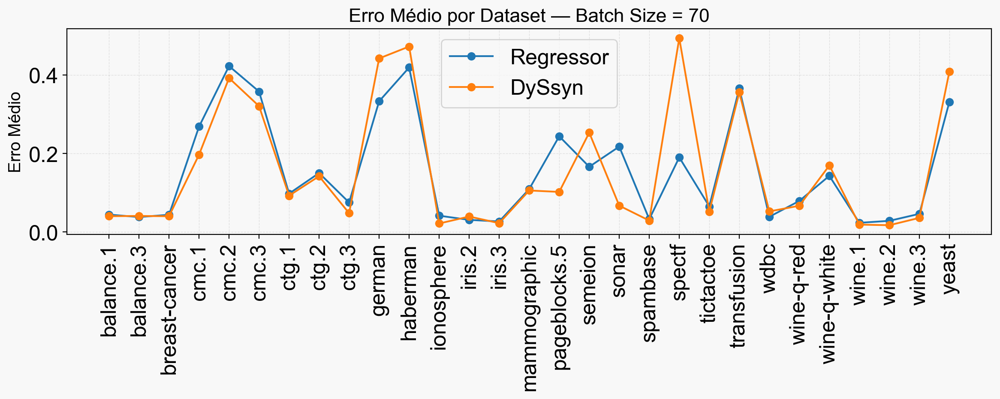

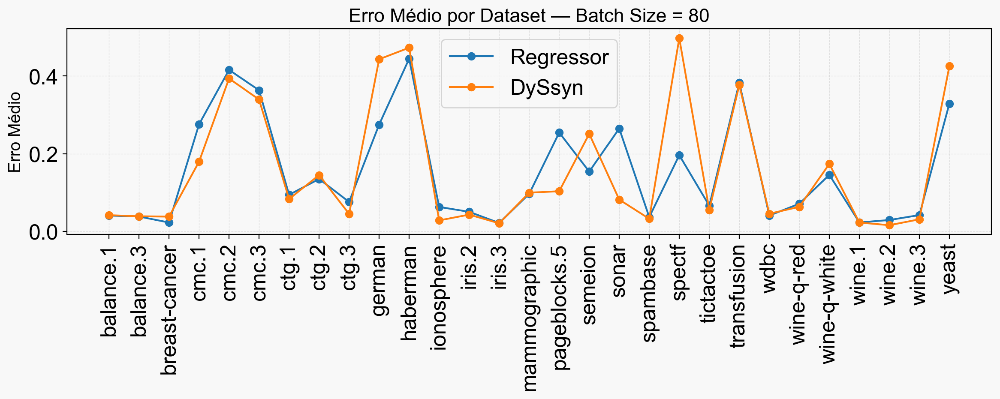

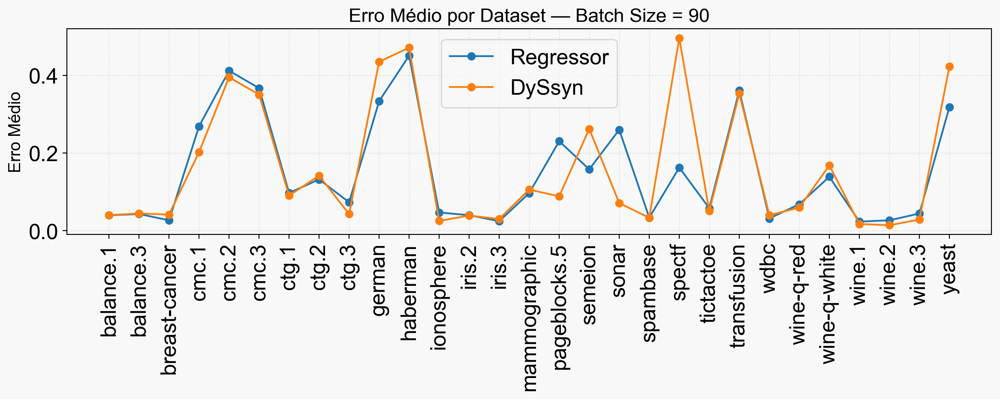


===== MÉDIA DOS ERROS POR BATCH SIZE =====

 Batch Size  Erro Médio Regressor  Erro Médio DySsyn
         10              0.161234           0.163932
         20              0.158823           0.161615
         30              0.163347           0.161901
         40              0.149693           0.160638
         50              0.157092           0.158550
         60              0.153311           0.157871
         70              0.152807           0.156588
         80              0.153351           0.158191
         90              0.150492           0.157150
        100              0.152668           0.164213
        110              0.154466           0.164757
        120              0.153551           0.164739
        130              0.156770           0.165481
        140              0.151245           0.163922
        150              0.153775           0.164111
        160              0.153165           0.164643
        170              0.155571           0.166143
 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import re

# Encontra automaticamente todos os CSVs no formato desejado
arquivos = sorted(glob.glob("resultados_APP_detalhado_batch*.csv"))

print("Arquivos encontrados:")
for a in arquivos:
    print(" -", a)

# Expressão regular para extrair o número do batch do nome do arquivo
regex = re.compile(r"batch(\d+)\.csv")

# Lista onde vamos acumular os dados da tabela final
linhas_tabela = []

for arquivo in arquivos:
    # Extrai o batch_size a partir do nome do arquivo
    match = regex.search(arquivo)
    if not match:
        print(f"⚠️ Nome de arquivo ignorado (não bate com padrão): {arquivo}")
        continue

    batch_size = int(match.group(1))

    # Lê o CSV correspondente
    df = pd.read_csv(arquivo)

    # Agrupa por dataset e calcula média dos erros
    df_medias = df.groupby("Dataset")[["Erro_Regressor", "Erro_DySsyn"]].mean().reset_index()

    # ======== GERAR GRÁFICO ========
    plt.figure(figsize=(12, 5))

    plt.plot(df_medias["Dataset"], df_medias["Erro_Regressor"], "o-", label="Regressor")
    plt.plot(df_medias["Dataset"], df_medias["Erro_DySsyn"], "o-", label="DySsyn")

    plt.xticks(rotation=90)
    plt.ylabel("Erro Médio")
    plt.title(f"Erro Médio por Dataset — Batch Size = {batch_size}")
    plt.legend()
    plt.tight_layout()

    plt.show()

    # ======== ACUMULAR PARA A TABELA FINAL ========
    erro_reg = df_medias["Erro_Regressor"].mean()
    erro_dys = df_medias["Erro_DySsyn"].mean()

    linhas_tabela.append({
        "Batch Size": batch_size,
        "Erro Médio Regressor": erro_reg,
        "Erro Médio DySsyn": erro_dys
    })


# ===========================
#   TABELA FINAL
# ===========================

df_tabela = pd.DataFrame(linhas_tabela).sort_values("Batch Size")
print("\n===== MÉDIA DOS ERROS POR BATCH SIZE =====\n")
print(df_tabela.to_string(index=False))

Datasets encontrados: 29
['balance.1' 'yeast' 'wine-q-white' 'wine-q-red' 'breast-cancer' 'iris.3'
 'pageblocks.5' 'mammographic' 'iris.2' 'semeion' 'cmc.1' 'wine.3' 'sonar'
 'ionosphere' 'haberman' 'spectf' 'spambase' 'german' 'cmc.2' 'wine.2'
 'cmc.3' 'wine.1' 'ctg.2' 'ctg.3' 'tictactoe' 'wdbc' 'transfusion' 'ctg.1'
 'balance.3']


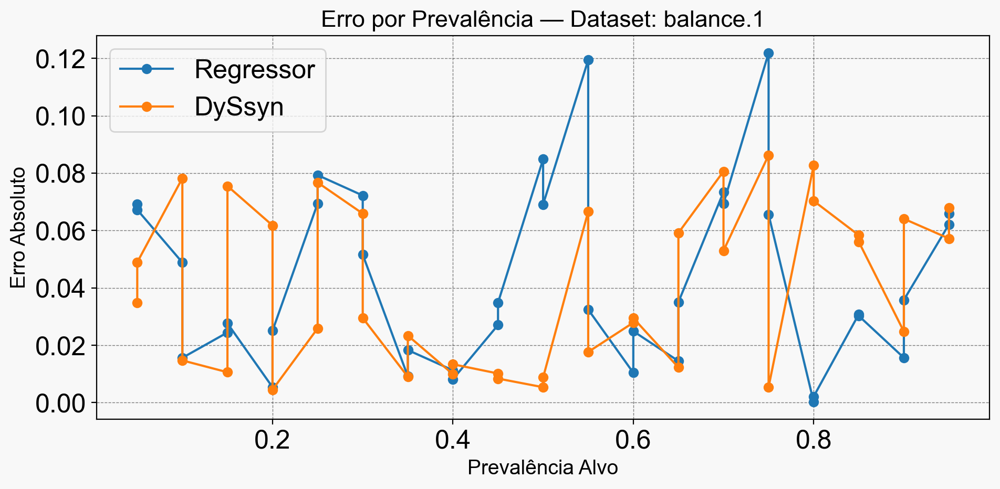

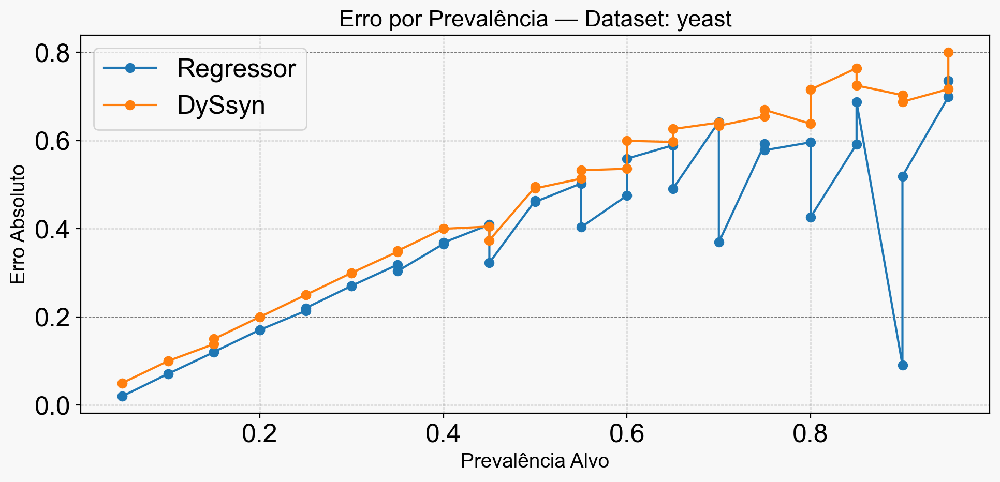

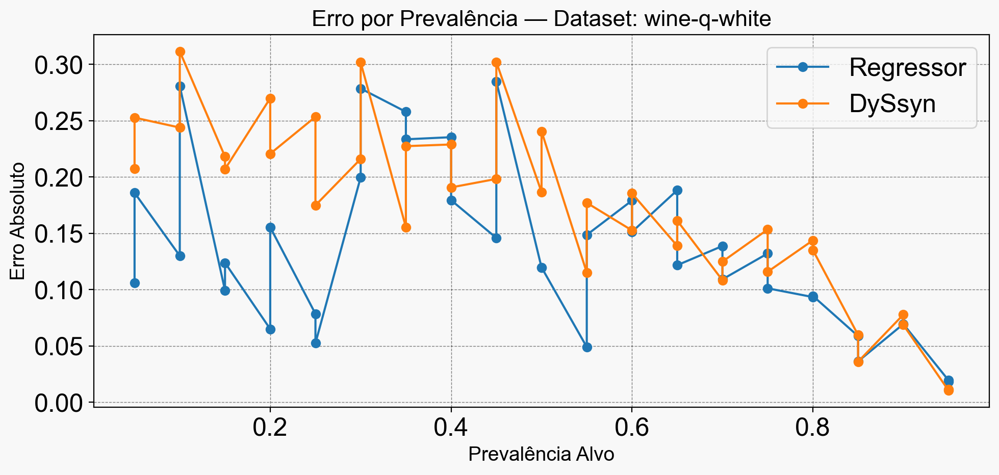

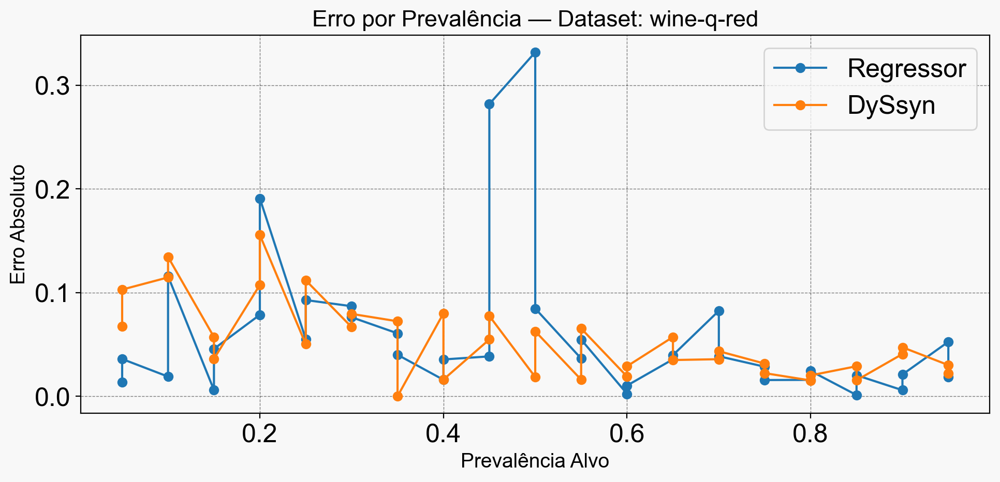

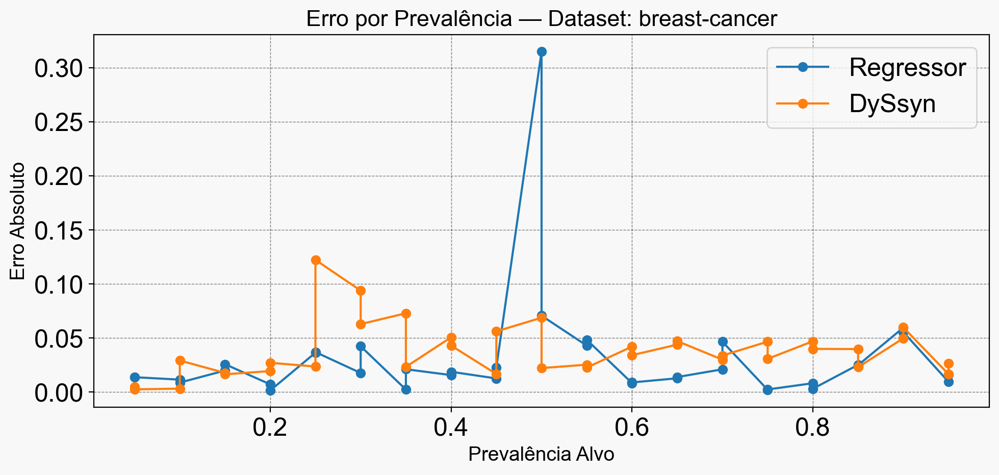

...

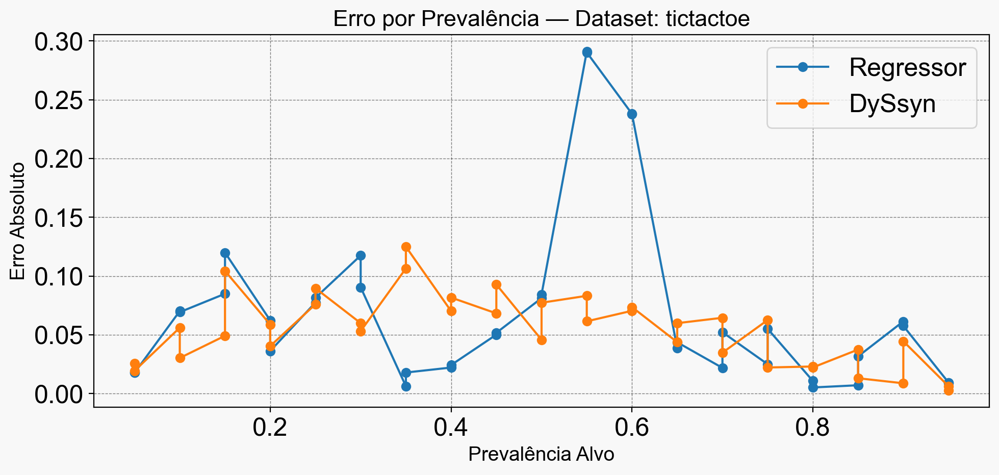

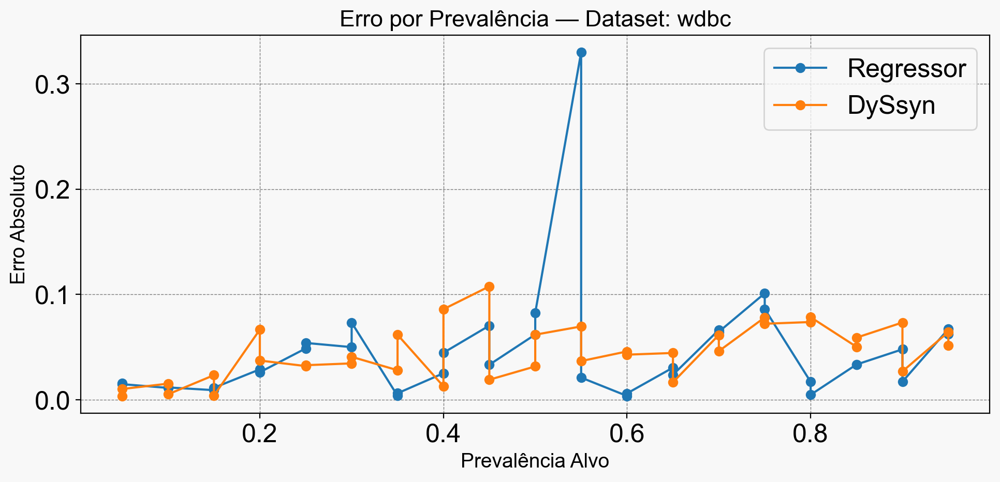

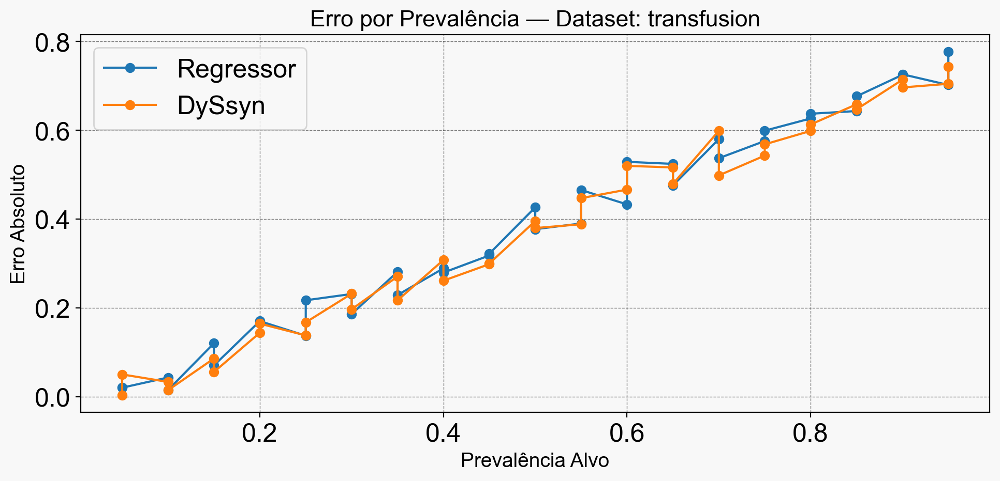

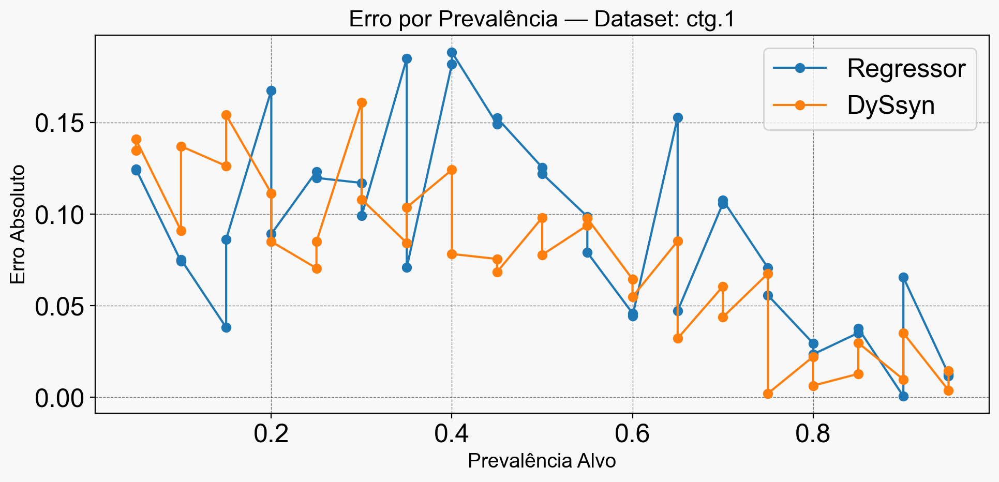

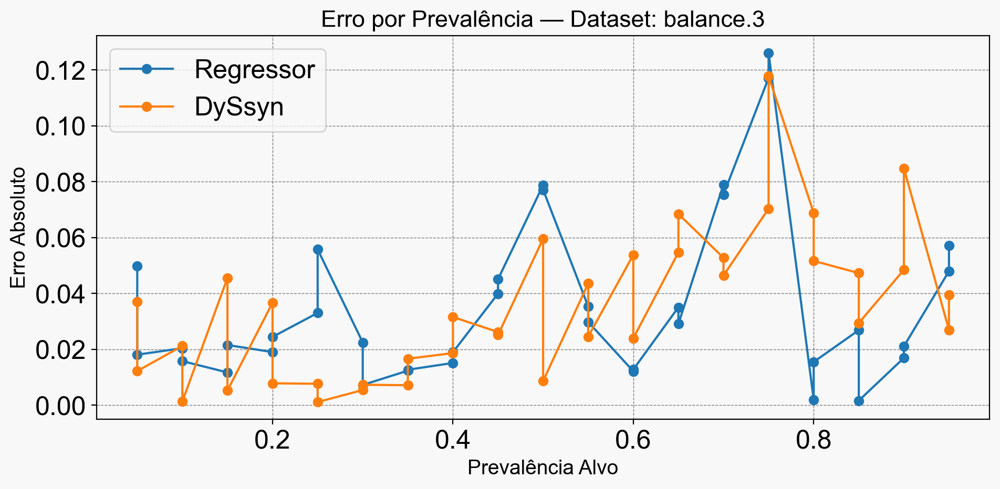

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Carrega o CSV
df = pd.read_csv("resultados_APP_detalhado_batch200.csv")

# Garante que está ordenado por prevalência (Prev_Alvo)
df = df.sort_values(by="Prev_Alvo")

datasets = df["Dataset"].unique()

print("Datasets encontrados:", len(datasets))
print(datasets)

# === LOOP PARA GERAR UM GRÁFICO POR DATASET ===
for dataset in datasets:
    df_sub = df[df["Dataset"] == dataset]

    plt.figure(figsize=(10, 5))

    # Plot do Regressor
    plt.plot(
        df_sub["Prev_Alvo"],
        df_sub["Erro_Regressor"],
        marker="o",
        label="Regressor"
    )

    # Plot do DySsyn
    plt.plot(
        df_sub["Prev_Alvo"],
        df_sub["Erro_DySsyn"],
        marker="o",
        label="DySsyn"
    )

    plt.xlabel("Prevalência Alvo")
    plt.ylabel("Erro Absoluto")
    plt.title(f"Erro por Prevalência — Dataset: {dataset}")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()


Datasets encontrados: 29
['balance.1' 'yeast' 'wine-q-white' 'wine-q-red' 'breast-cancer' 'iris.3'
 'pageblocks.5' 'mammographic' 'iris.2' 'semeion' 'cmc.1' 'wine.3' 'sonar'
 'ionosphere' 'haberman' 'spectf' 'spambase' 'german' 'cmc.2' 'wine.2'
 'cmc.3' 'wine.1' 'ctg.2' 'ctg.3' 'tictactoe' 'wdbc' 'transfusion' 'ctg.1'
 'balance.3']


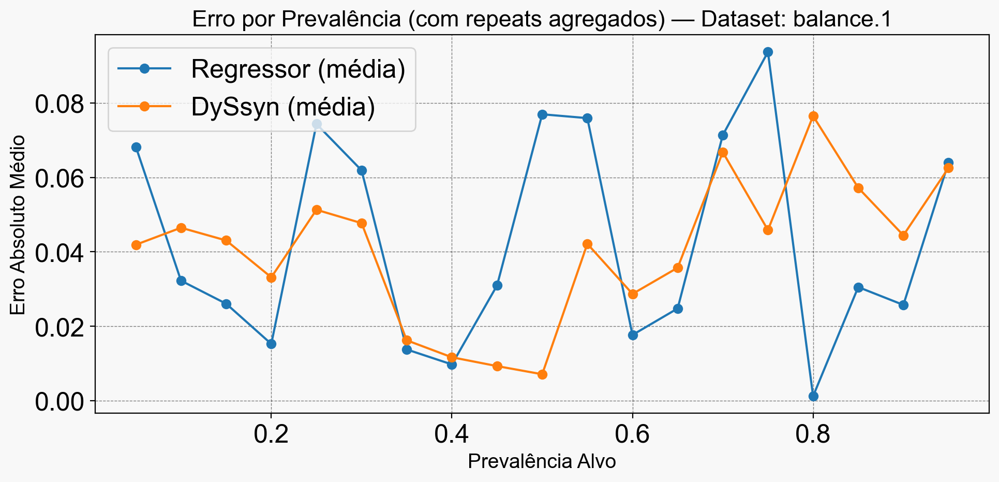

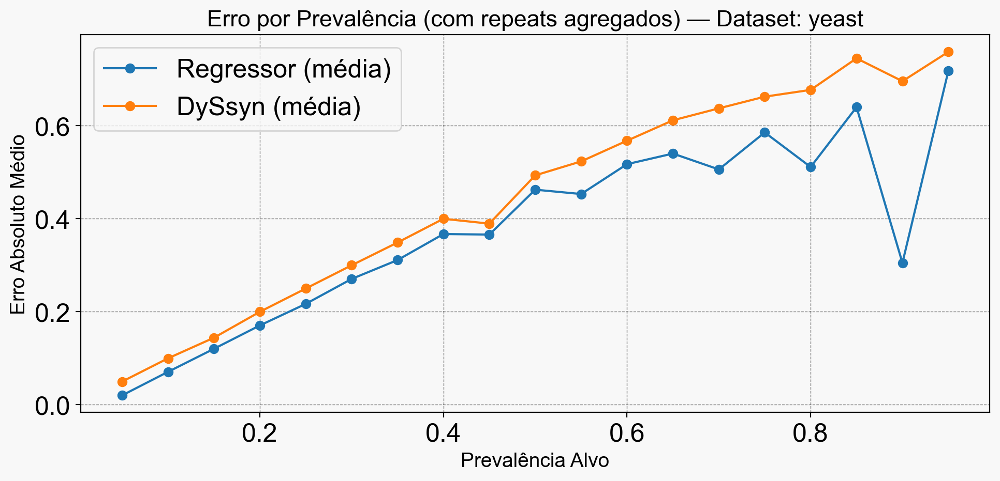

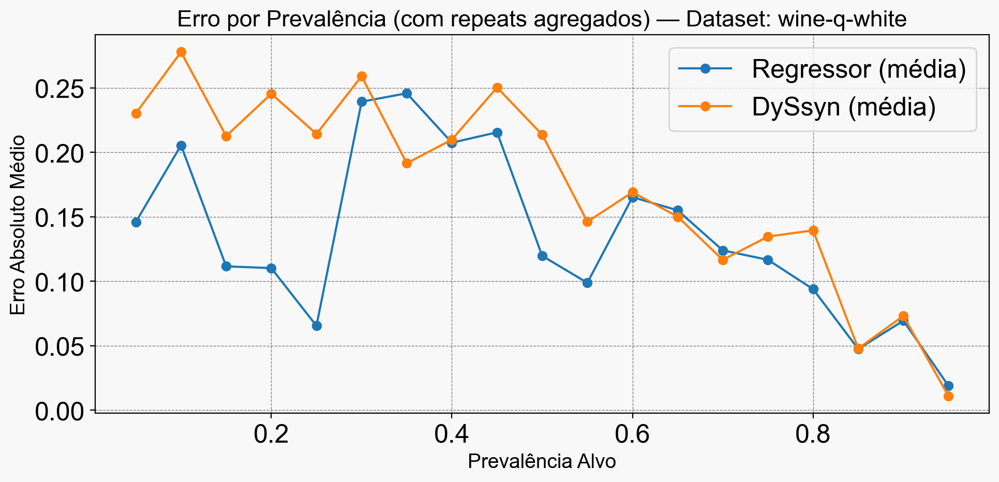

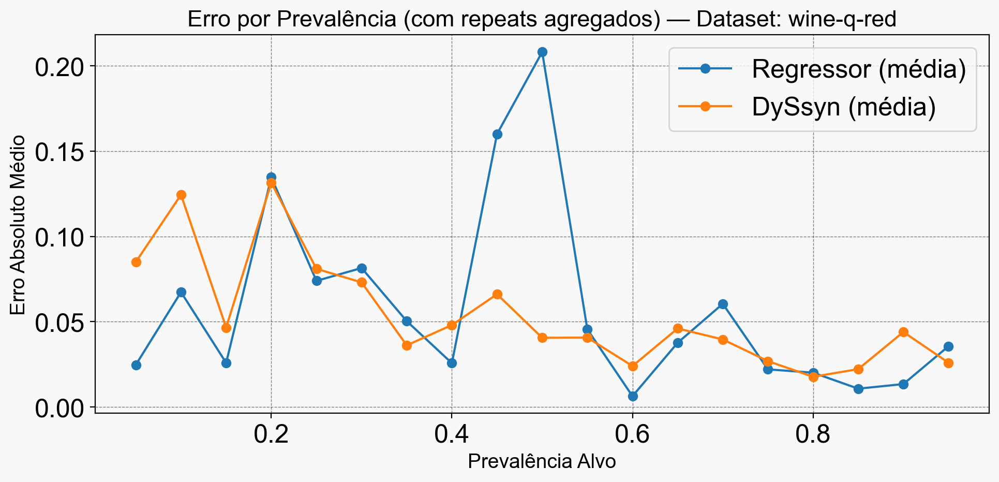

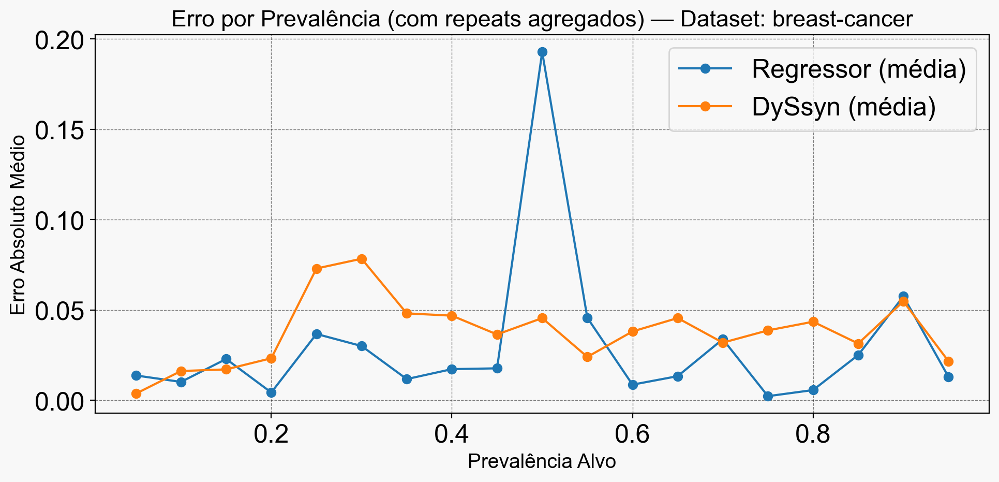

...

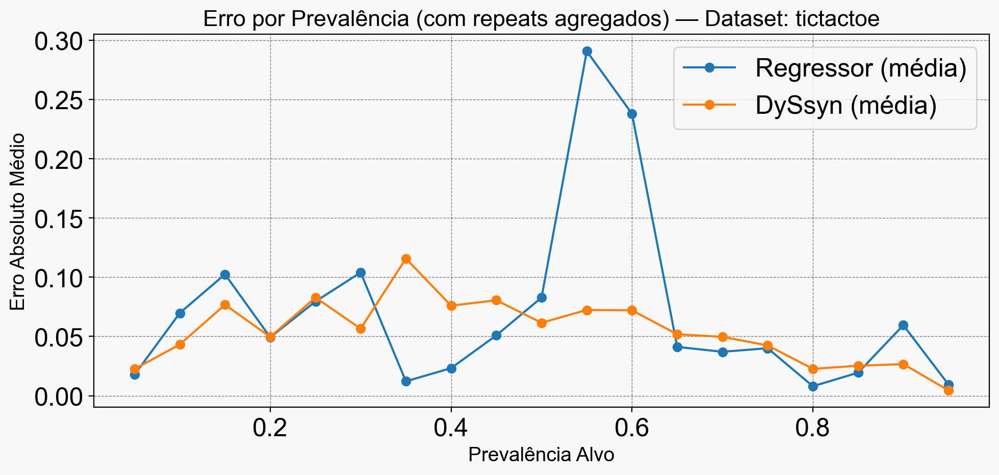

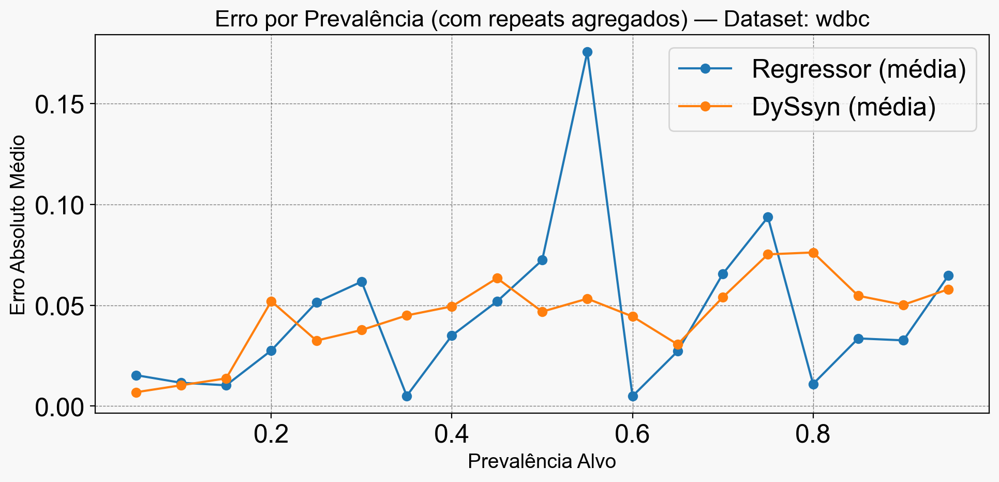

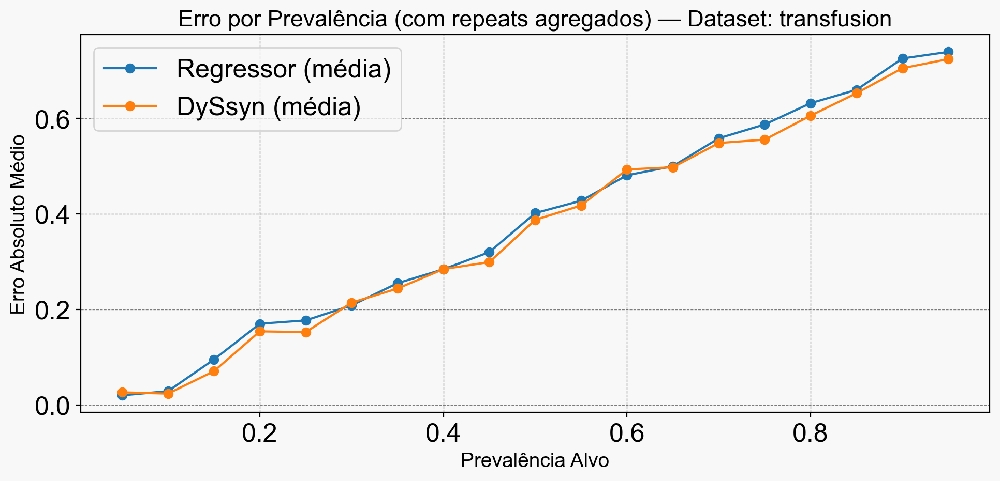

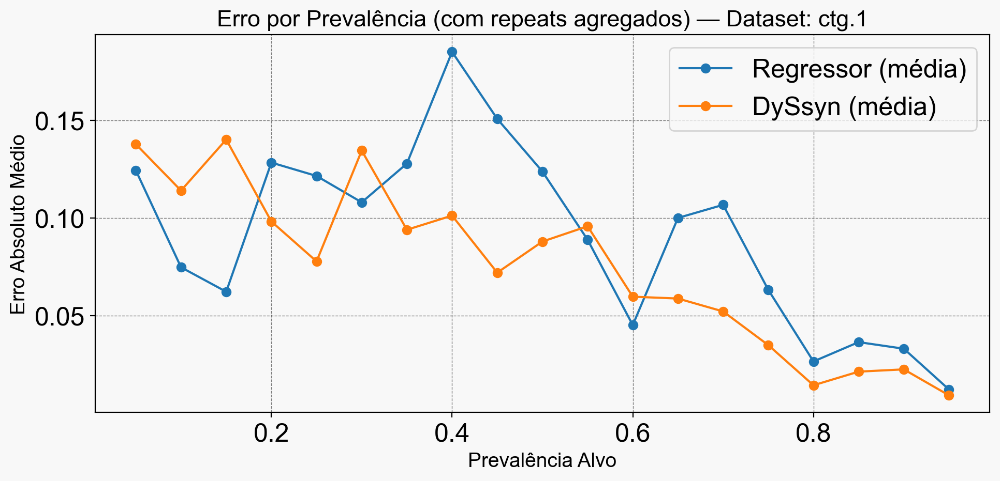

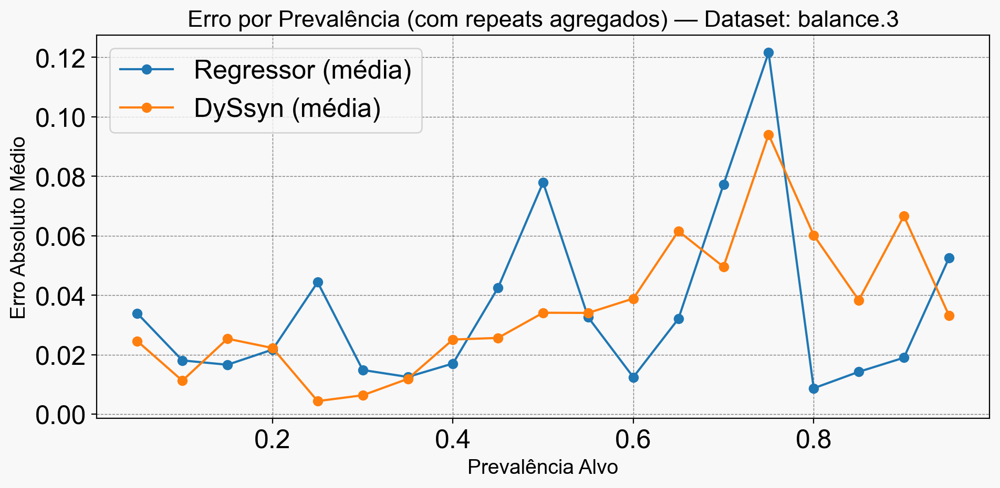

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Carrega o CSV
df = pd.read_csv("resultados_APP_detalhado_batch200.csv")

# Garante ordem por prevalência
df = df.sort_values(by="Prev_Alvo")

datasets = df["Dataset"].unique()

print("Datasets encontrados:", len(datasets))
print(datasets)

# === LOOP PARA GRÁFICOS POR DATASET ===
for dataset in datasets:
    df_sub = df[df["Dataset"] == dataset]

    # Aqui ocorre a mágica:
    # Agrupa por prevalência e tira a média dos erros
    df_mean = (
        df_sub.groupby("Prev_Alvo")[["Erro_Regressor", "Erro_DySsyn"]]
        .mean()
        .reset_index()
    )

    plt.figure(figsize=(10, 5))

    # Plot do Regressor (já suavizado pela média)
    plt.plot(
        df_mean["Prev_Alvo"],
        df_mean["Erro_Regressor"],
        marker="o",
        label="Regressor (média)"
    )

    # Plot do DySsyn (média)
    plt.plot(
        df_mean["Prev_Alvo"],
        df_mean["Erro_DySsyn"],
        marker="o",
        label="DySsyn (média)"
    )

    plt.xlabel("Prevalência Alvo")
    plt.ylabel("Erro Absoluto Médio")
    plt.title(f"Erro por Prevalência (com repeats agregados) — Dataset: {dataset}")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()
